In [3]:
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.utils import plot_model
import tensorflow as tf
from tensorflow.keras import preprocessing
from tensorflow.keras import datasets, layers, models
from tensorflow.keras.layers import Flatten, Dense, Dropout, Input
from tensorflow.keras.models import Model
import tensorflow.compat.v1.keras.backend as K #version error

# other models
# from tensorflow.keras.applications.inception_v3 import InceptionV3
# from tensorflow.keras.applications.resnet import ResNet50
# from tensorflow.keras.applications.vgg19 import VGG19


In [4]:
# File I/O
import subprocess
import shutil
import os
from glob import glob
from datetime import datetime
import argparse

# 데이터 처리
import pandas as pd
import numpy as np
# from sklearn.cross_validation import KFold

# 이미지 처리
import cv2
from scipy.ndimage import rotate
import scipy.misc

In [5]:
#pip install pydot
#pip install graphviz

# 모델 생성하기
VGG-16을 tensorflow hub에서 가지고 와서 입력데이터에 알맞게 수정해준다. 

In [6]:
#기존 모델 구조를 지금 사용할 input data에 맞게 약간 수정해줘야 한다. 
#include_top을 False로 설정해 convolutional layer만 가지고 온다. 

base_model = VGG16(weights=None, include_top=False, input_shape = (224, 224, 3))

In [7]:
print(base_model.summary())

Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0     

In [8]:
out = Flatten()(base_model.output)
#4096인데 dropout전에 이미 줄여주는 이유는?
out = Dense(2048, activation = 'relu')(out) 
out = Dropout(0.5)(out)
out = Dense(1024, activation = 'relu')(out)
out = Dropout(0.5)(out)
out = Dense(10, activation = 'softmax')(out)

model = Model(inputs=base_model.input, outputs=out)

In [9]:
print(model.summary())

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0     

In [103]:
#위에서 수정한 모델을 기반으로 모델생성 함수 만들기 
# compile에서 optimizer는 stochastic gradient descent 사용

def get_model():
    base_model = VGG16(weights=None, include_top=False, input_shape = (224, 224, 3))
    
    #전결층 정의
    out = Flatten()(base_model.output)
    out = Dense(2048, activation = 'relu')(out) 
    out = Dropout(0.5)(out)
    out = Dense(1024, activation = 'relu')(out)
    out = Dropout(0.5)(out)
    out = Dense(10, activation = 'softmax')(out)
    model = Model(inputs=base_model.input, outputs=out)
    
    return model

# 데이터셋 만들기

In [11]:
import PIL
import pathlib

In [12]:
data_dir = r"C:/Users/Public/state-farm-distracted-driver-detection/imgs/"
train_path = data_dir + 'train/imgs'
test_path = data_dir + 'test'

In [13]:
batch_size = 8
img_height = 224
img_width = 224

In [14]:
train_path

'C:/Users/Public/state-farm-distracted-driver-detection/imgs/train/imgs'

In [15]:
test_path

'C:/Users/Public/state-farm-distracted-driver-detection/imgs/test'

# 오류사항
* tensorflow v2- 에서는 image_dataset_from_directory를 사용할 수 없음<br>
https://github.com/keras-team/keras-io/issues/12

* 이전버전의 기능을 사용하기 위해서 tf-nightly도 설치해 준다. 

In [ ]:
#pip install tf-nightly
#pip install --upgrade tf-nightly #CPU
#pip install --upgrade tf-nightly-gpu #GPU
#권한 문제로 --user 포함해서 다시 시도 

In [ ]:
pip install --user tf-nightly-gpu 

In [16]:
train_ds = tf.keras.preprocessing.image_dataset_from_directory(
  directory= train_path,
  validation_split=0.2,
  subset="training",
  seed=2021,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 22424 files belonging to 10 classes.
Using 17940 files for training.


In [17]:
val_ds = tf.keras.preprocessing.image_dataset_from_directory(
  directory = train_path,
  validation_split=0.2,
  subset="validation",
  seed=2021,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 22424 files belonging to 10 classes.
Using 4484 files for validation.


In [18]:
import matplotlib.pyplot as plt
%matplotlib inline

import os #환경 변수 및 디렉터리, 파일 등 OS자원을 제어할 수 있게 해주는 모듈
from glob import glob #특정 디렉토리에 있는 파일들을 리스트로 제어

#https://docs.opencv.org/master/da/df6/tutorial_py_table_of_contents_setup.html
#이미지 처리를 위한 OpenCV모듈

import cv2
import PIL
import numpy as np

In [19]:
def read_image(path):
    image = cv2.imread(path, cv2.IMREAD_COLOR)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    return image

In [20]:
file_name = 'img_21.jpg'

In [21]:
test_path = 'C:/Users/Public/state-farm-distracted-driver-detection/imgs/test/imgs'
test_path

'C:/Users/Public/state-farm-distracted-driver-detection/imgs/test/imgs'

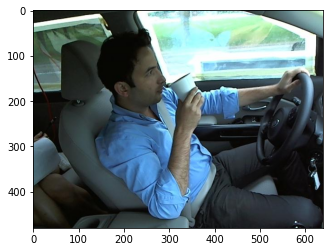

In [22]:
# 이미지 데이터 읽어오기
image = read_image(test_path+'/'+file_name)

# 이미지 시각화
plt.imshow(image)

In [23]:
image

array([[[ 23,  26,  19],
        [ 23,  26,  19],
        [ 23,  26,  19],
        ...,
        [246, 255, 245],
        [248, 255, 248],
        [248, 255, 248]],

       [[ 23,  26,  19],
        [ 23,  26,  19],
        [ 23,  26,  19],
        ...,
        [244, 255, 244],
        [246, 255, 247],
        [246, 255, 247]],

       [[ 23,  26,  19],
        [ 23,  26,  19],
        [ 23,  26,  19],
        ...,
        [240, 255, 241],
        [244, 255, 243],
        [244, 255, 245]],

       ...,

       [[ 14,  16,  13],
        [ 14,  16,  13],
        [ 14,  16,  13],
        ...,
        [ 39,  49,  50],
        [ 59,  69,  70],
        [ 65,  77,  77]],

       [[ 12,  16,  15],
        [ 12,  16,  15],
        [ 13,  17,  16],
        ...,
        [ 31,  41,  42],
        [ 53,  63,  64],
        [ 62,  74,  74]],

       [[ 11,  15,  14],
        [ 11,  15,  14],
        [ 12,  16,  15],
        ...,
        [ 29,  39,  40],
        [ 52,  62,  63],
        [ 62,  74,  74]]

In [24]:
#분류할 클래스 설정

class_names={'c0': 'normal driving', 
             'c1': 'texting - right',
             'c2': 'talking on the phone - right',
             'c3': 'texting - left',
             'c4': 'talking on the phone - left',
             'c5': 'operating the radio',
             'c6': 'drinking',
             'c7': 'reaching behind',
             'c8': 'hair and makeup',
             'c9': 'talking to passenger'
            }

In [24]:
for c, n in class_names.items():
    print(c,' ',n)

c0   normal driving
c1   texting - right
c2   talking on the phone - right
c3   texting - left
c4   talking on the phone - left
c5   operating the radio
c6   drinking
c7   reaching behind
c8   hair and makeup
c9   talking to passenger


In [25]:
class_name=[]
for n in class_names: 
    class_name.append(n)
    

In [26]:
class_name

['c0', 'c1', 'c2', 'c3', 'c4', 'c5', 'c6', 'c7', 'c8', 'c9']

In [27]:
#test data set
test_id = [os.path.basename(fl) for fl in glob('{}/*.jpg'.format(test_path))]
test_id['102149']

['img_1.jpg', 'img_10.jpg', 'img_100.jpg', 'img_1000.jpg', 'img_100000.jpg']

# 공부했던 대로 한번 돌려보기
튜토리얼을 통해서 실시했던 학습을 그대로 실시해본다. 

In [ ]:
get_model()

In [ ]:
#SGD Optimizer
sgd = tf.keras.optimizers.SGD(learning_rate=0.01)
model.compile(optimizer=sgd, loss='categorical_crossentropy', metrics = ['accuracy'])
    

In [ ]:
epochs=5
history = model.fit(
    train_ds, epochs=epochs, verbose='auto',
    validation_data=val_ds, batch_size = 8
)

#1epoch 돌리는데 2시간 가까이 걸렸다. 안 되겠다 싶어서 보니 cpu로 돌리고 있어 gpu를 사용할 수 있는 방법을 찾기 시작 
#gpu세팅을 다시 해보고 도저히 안 되면 구글 코랩을 사용하는 방향으로 해봐야겠다. 
#gpu세팅을 완료 다시 돌려보기

# 데이터 전처리
<br>
대용량 데이터를 효과적으로 다루고, 전처리를 편하게 하기 위해 
ImageDataGenerator를 이용해봅니다.<br>

In [28]:
from keras.preprocessing.image import ImageDataGenerator

In [29]:
def crop_center(img, cropx, cropy):
    # 이미지 중간을 Crop하는 함수를 정의한다
    y,x = img.shape
    startx = x//2-(cropx//2)
    starty = y//2-(cropy//2)    
    return img[starty:starty+cropy,startx:startx+cropx]

In [30]:
#데이터의 여러가지 augmentation 실시 - 적용하지 못해봄

def preprocess(image):
    # rescale
    image /= 255.

    # rotate
    rotate_angle = np.random.randint(40) - 20
    image = rotate(image, rotate_angle)

    # translate
    rows, cols, _ = image.shape
    width_translate = np.random.randint(60) - 30
    height_translate = np.random.randint(60) - 30
    M = np.float32([[1,0,width_translate],[0,1,height_translate]])
    image = cv2.warpAffine(image,M,(cols,rows))    

    # zoom
    width_zoom = int(img_row_size * (0.8 + 0.2 * (1 - np.random.random())))
    height_zoom = int(img_col_size * (0.8 + 0.2 * (1 - np.random.random())))
    final_image = np.zeros((height_zoom, width_zoom, 3))
    final_image[:,:,0] = crop_center(image[:,:,0], width_zoom, height_zoom)
    final_image[:,:,1] = crop_center(image[:,:,1], width_zoom, height_zoom)
    final_image[:,:,2] = crop_center(image[:,:,2], width_zoom, height_zoom)

    # resize
    image = cv2.resize(final_image, (img_row_size, img_col_size))
    return image


In [31]:
#datagen = ImageDataGenerator(preprocessing_function=preprocess)

In [32]:
datagen = tf.keras.preprocessing.image.ImageDataGenerator()

#train_ds
train_generator = datagen.flow_from_directory(
    directory=train_path,
    target_size=(224,224), 
    batch_size=8,
    class_mode = 'categorical',
    seed = 2021)

#val_ds
valid_generator = datagen.flow_from_directory(
    directory=train_path,
    target_size=(224,224),
    batch_size=8,
    class_mode = 'categorical',
    seed = 2021)


Found 22424 images belonging to 10 classes.
Found 22424 images belonging to 10 classes.


In [33]:
#test_ds
test_generator = datagen.flow_from_directory(
    'C:/Users/Public/state-farm-distracted-driver-detection/imgs/test/',
    target_size=(224,224),
    batch_size=1,
    class_mode = None
    )

Found 79726 images belonging to 1 classes.


# 학습데이터 훈련
<br>

* 위에서 **image_generator**로 만들어 놓은 데이터(훈련,검증,테스트)를 가져옵니다.<br>


* **stochastic gradient descent**를 이용합니다.<br>
  : SGD는 미니배치(mini-batch)기법을 통해 전체 train-set이 아닌 일부만을 이용해 여러 step 경사하강을 실시합니다. <br>
  local minimum에 도달할 오류를 줄일 수 있고 여러번 반복할 경우 batch 전체를 돌린 결과에 수렴합니다.<br>
  대체로 많은 딥러닝들은 대용량으로 미니배치 기법과 SGD(또는 그 다양한 파생법)을 사용합니다. <br>


* **loss는 categorical_crossentropy**를 이용합니다.<br> 
  : 입력값과 출력값 모두 one-hot representation형태로 encoding됩니다. 
  네트웍 레이어 구성시 마지막에 Dense(3, activation='softmax') 로 3개의 클래스 각각 별로 positive 확률값이 나오게 됩니다.

In [34]:
#위에서 정의해 놓은 모델을 불러온다.
get_model()

In [35]:
#model compile
#SGD Optimizer

sgd = tf.keras.optimizers.SGD(learning_rate=0.01)
model.compile(optimizer=sgd, loss='categorical_crossentropy', metrics = ['accuracy'])

In [36]:
#model을 학습시키고 history변수에 저장하기

epochs=10
history = model.fit(
    train_generator, epochs=epochs, verbose=1,
    validation_data=valid_generator, batch_size = 8
)

Epoch 1/10
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
2803/2803 [==============================] - ETA: 0s - loss: 2.0935 - accuracy: 0.2069WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x0000010CDC7491F8> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=1

In [64]:
# 모델에 학습시킨 파라미터를 저장하거나 불러들일 수 있다.
model.save('model-VGG16')

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: module 'gast' has no attribute 'Constant'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: module 'gast' has no attribute 'Constant'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity t

In [ ]:
model.load('model-VGG16')

## Visualize training results

Create plots of loss and accuracy on the training and validation sets.

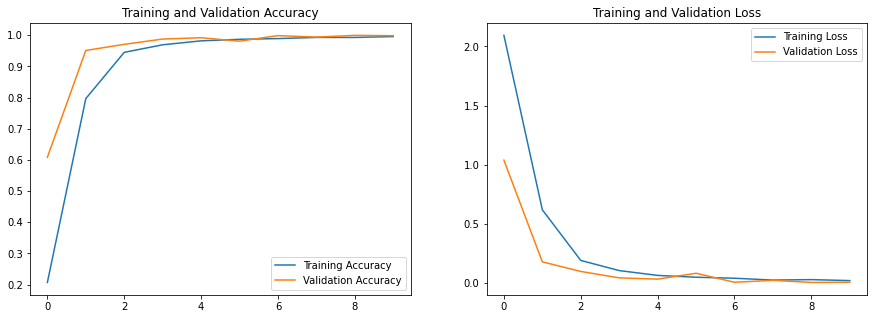

In [50]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

# 이미지 분류 예측하기

* 하나의 이미지만 불러와서 학습한 모델로 이미지분류 예측을 수행해봅니다. <br>
* input image가 224X224이기 때문에 사전에 리사이징을 거쳐줘야 정상적으로 fit이 가능했습니다. <br>
* 이후 전체 test matrix에 대해 예측을 수행해준 후 결과값을 csv값으로 저장합니다.

In [40]:
#size 변형
img = tf.image.resize(image, [224,224])

In [41]:
img_array = tf.keras.preprocessing.image.img_to_array(img)
img_array = tf.expand_dims(img_array, 0) # Create a batch
img_array

<tf.Tensor: shape=(1, 224, 224, 3), dtype=float32, numpy=
array([[[[ 23.       ,  26.       ,  19.       ],
         [ 23.       ,  26.       ,  19.       ],
         [ 23.       ,  26.       ,  19.       ],
         ...,
         [226.08176  , 251.06125  , 223.59201  ],
         [239.60208  , 254.55103  , 238.02046  ],
         [246.85715  , 255.       , 247.42857  ]],

        [[ 23.       ,  26.       ,  19.       ],
         [ 23.       ,  26.       ,  19.       ],
         [ 23.       ,  26.       ,  19.       ],
         ...,
         [215.88786  , 245.50003  , 214.88786  ],
         [227.78575  , 252.15309  , 228.8776   ],
         [238.38782  , 255.       , 239.57152  ]],

        [[ 23.       ,  26.       ,  19.       ],
         [ 23.       ,  26.       ,  19.       ],
         [ 23.       ,  26.       ,  19.       ],
         ...,
         [202.1225   , 238.73473  , 204.97963  ],
         [210.3572   , 244.24493  , 212.32658  ],
         [222.27559  , 255.       , 223.27559 

In [42]:
predictions = model.predict(img_array)
score = tf.nn.softmax(predictions[0])
title = class_names[class_name[np.argmax(score)]]

print(
    "This image most likely belongs to {} {} with a {:.2f} percent confidence."
    .format(class_name[np.argmax(score)], title, 100 * np.max(score))
)
score

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
This image most likely belongs to c6 drinking with a 23.19 percent confidence.


<tf.Tensor: shape=(10,), dtype=float32, numpy=
array([0.08534259, 0.08534338, 0.08534388, 0.08534256, 0.08534268,
       0.08534272, 0.23187755, 0.08534257, 0.08537946, 0.0853426 ],
      dtype=float32)>

In [101]:
#예측 수행과정 조립하기 

def predict(model, img):
    predictions = model.predict(img)
 
    return predictions


In [ ]:
#score print
   score = tf.nn.softmax(predictions)
    title = []
    
    for s in score : 
        title.append(class_names[class_name[np.argmax(score)]])

print(score)
print(
    "\nThis image most likely belongs to {} {} with a {:.2f} percent confidence.\n"
    .format(class_name[np.argmax(score)], title, 100 * np.max(score))
)

In [58]:
predict(model, img_array)

tf.Tensor(
[0.08534259 0.08534338 0.08534388 0.08534256 0.08534268 0.08534272
 0.23187755 0.08534257 0.08537946 0.0853426 ], shape=(10,), dtype=float32)

This image most likely belongs to c6 drinking with a 23.19 percent confidence.



array([[5.7345250e-07, 9.8148539e-06, 1.5677377e-05, 1.8632602e-07,
        1.6029982e-06, 2.1538856e-06, 9.9953640e-01, 3.6416282e-07,
        4.3250748e-04, 6.9101611e-07]], dtype=float32)

In [100]:
#전체 테스트 데이터에 대한 예측 수행
predictions = predict(model, test_generator)

IndexError: list index out of range

In [87]:
#예측수행 결과값을 pandas DataFrame 형태로 저장
result = pd.DataFrame(predictions, columns=class_name)
result.loc[:,'img'] = pd.Series(test_id, index=result.index)


'c0,c1,c2,c3,c4,c5,c6,c7,c8,c9,img\r\n0.014698349,0.0002958628,0.00016585719,8.84883e-05,0.0014136028,0.79457515,0.00043610265,0.0132217435,0.0121725155,0.16293228,img_1.jpg\r\n3.8167563e-08,1.526377e-08,2.811728e-09,0.9999999,2.6177824e-08,1.1771284e-08,9.7124676e-08,3.3327678e-09,3.0802376e-09,1.540257e-08,img_10.jpg\r\n8.310541e-11,8.7384683e-16,3.2535636e-13,1.2873997e-14,3.2604407e-13,0.9999994,9.027529e-15,3.745093e-13,1.6872635e-13,6.307283e-07,img_100.jpg\r\n1.2944358e-10,0.99999666,1.3178569e-08,2.5094156e-08,2.0404653e-10,7.500599e-11,2.4004437e-06,1.77545e-10,8.920214e-07,2.127874e-08,img_1000.jpg\r\n4.3774133e-05,3.0416754e-08,5.798101e-09,6.641815e-05,6.0777516e-08,1.0300027e-07,1.3721908e-07,3.3226477e-09,0.9998884,1.0565054e-06,img_100000.jpg\r\n1.1895233e-09,2.9612174e-10,1.10593736e-10,0.9999999,4.1706545e-09,4.66546e-10,1.1529299e-07,1.6672026e-10,3.7260767e-10,6.376502e-10,img_100001.jpg\r\n0.00718795,0.0021229177,0.035154667,0.017889792,0.8308053,0.00052452175,0.011

In [94]:
#예측수행 결과값을 csv로 저장
file = 'pred'
path = 'D:\\Study\\0.전공\\2.인공지능1\\개인프로젝트\\{}.csv'.format(file)
result.to_csv(path, index = 'False')

In [88]:
result.head()

,c0,c1,c2,c3,c4,c5,c6,c7,c8,c9,img
0,1.469835e-02,2.958628e-04,1.658572e-04,8.848830e-05,1.413603e-03,7.945752e-01,4.361027e-04,1.322174e-02,1.217252e-02,1.629323e-01,img_1.jpg
1,3.816756e-08,1.526377e-08,2.811728e-09,9.999999e-01,2.617782e-08,1.177128e-08,9.712468e-08,3.332768e-09,3.080238e-09,1.540257e-08,img_10.jpg
2,8.310541e-11,8.738468e-16,3.253564e-13,1.287400e-14,3.260441e-13,9.999994e-01,9.027529e-15,3.745093e-13,1.687263e-13,6.307283e-07,img_100.jpg
3,1.294436e-10,9.999967e-01,1.317857e-08,2.509416e-08,2.040465e-10,7.500599e-11,2.400444e-06,1.775450e-10,8.920214e-07,2.127874e-08,img_1000.jpg
4,4.377413e-05,3.041675e-08,5.798101e-09,6.641815e-05,6.077752e-08,1.030003e-07,1.372191e-07,3.322648e-09,9.998884e-01,1.056505e-06,img_100000.jpg


# 모델에 기 학습 파라미터(ImageNet)를 가지고 다시 시도해보기

* 처음부터 끝까지의 과정을 한 번 더 수행해본다.

In [145]:
#위에서 수정한 모델을 기반으로 모델생성 함수 만들기 
# compile에서 optimizer는 stochastic gradient descent 사용

def get_model2():
    model2 = VGG16(weights='imagenet', include_top=False, input_shape = (224, 224, 3))
    
    #전결층 정의
    out = Flatten()(model2.output)
    out = Dense(2048, activation = 'relu')(out) 
    out = Dropout(0.5)(out)
    out = Dense(1024, activation = 'tanh')(out)
    out = Dropout(0.5)(out)
    out = Dense(10, activation = 'softmax')(out)
    model2 = Model(inputs=model2.input, outputs=out)
    
    return model2

#As far as I know, it's the combination of relu and softmax that causes numerical troubles, 
#as relu can produce large positive values corresponding to very small probabilities. 
#If you change your model to use, say, tanh instead of relu for the last dense layer, the problem will go away.

In [146]:
model2 = get_model2()

In [147]:
model2.summary()

Model: "model_9"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_10 (InputLayer)        [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0   

In [148]:
#model compile
#SGD Optimizer

sgd = tf.keras.optimizers.SGD(learning_rate=0.01)
model2.compile(optimizer=sgd, loss='categorical_crossentropy', metrics = ['accuracy'])

In [149]:
#model을 학습시키고 history변수에 저장하기

epochs=10
history2 = model2.fit(
    train_generator, epochs=epochs, verbose=1,
    validation_data=valid_generator, batch_size = 8
)

#loss가 나오지 않는 오류가 발생하여(nan 발생) https://github.com/keras-team/keras/issues/1244를 참조
#relu와 softmax를 함께 사용하면 계산문제가 발생하기 때문에 제대로 작동을 안 하므로 마지막 레이어의 activation함수를 
#tanh로 대체해 볼 것을 제안하고 있어 불가피하게 변경, loss가 정상적으로 표시되는 것을 확인
#처음 모델은 imagenet 가중치를 사용하지 않았기 때문에 작동했을 것으로 추측 

Epoch 1/10
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
2803/2803 [==============================] - ETA: 0s - loss: 3.2140 - accuracy: 0.1029WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x0000010D2E037F78> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=1

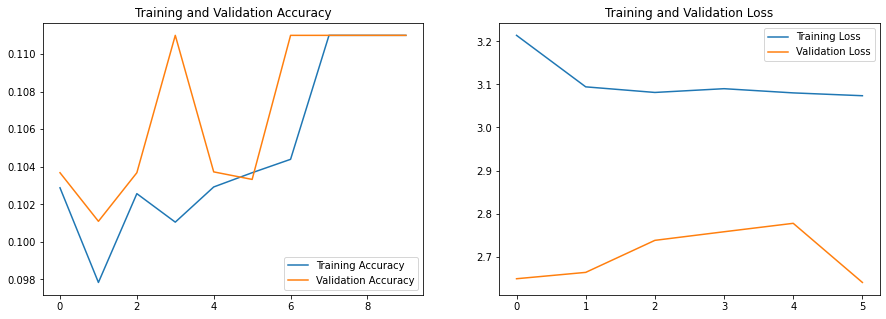

In [150]:
# 결과 시각화
acc = history2.history['accuracy']
val_acc = history2.history['val_accuracy']

loss = history2.history['loss']
val_loss = history2.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

In [151]:
#전체 테스트 데이터에 대한 예측 수행
predictions2 = predict(model2, test_generator)

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert


In [152]:
#예측수행 결과값을 pandas DataFrame 형태로 저장
result2 = pd.DataFrame(predictions2, columns=class_name)
result2.loc[:,'img'] = pd.Series(test_id, index=result2.index)


In [153]:
#예측수행 결과값을 csv로 저장
file = 'pred2'
path = 'D:\\Study\\0.전공\\2.인공지능1\\개인프로젝트\\{}.csv'.format(file)
result.to_csv(path, index = 'False')

In [154]:
result.head()

,c0,c1,c2,c3,c4,c5,c6,c7,c8,c9,img
0,1.469835e-02,2.958628e-04,1.658572e-04,8.848830e-05,1.413603e-03,7.945752e-01,4.361027e-04,1.322174e-02,1.217252e-02,1.629323e-01,img_1.jpg
1,3.816756e-08,1.526377e-08,2.811728e-09,9.999999e-01,2.617782e-08,1.177128e-08,9.712468e-08,3.332768e-09,3.080238e-09,1.540257e-08,img_10.jpg
2,8.310541e-11,8.738468e-16,3.253564e-13,1.287400e-14,3.260441e-13,9.999994e-01,9.027529e-15,3.745093e-13,1.687263e-13,6.307283e-07,img_100.jpg
3,1.294436e-10,9.999967e-01,1.317857e-08,2.509416e-08,2.040465e-10,7.500599e-11,2.400444e-06,1.775450e-10,8.920214e-07,2.127874e-08,img_1000.jpg
4,4.377413e-05,3.041675e-08,5.798101e-09,6.641815e-05,6.077752e-08,1.030003e-07,1.372191e-07,3.322648e-09,9.998884e-01,1.056505e-06,img_100000.jpg
